# Filtros

In [1]:
import cv2


def apply_clahe(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)


# Carregamento da base

In [2]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

#funcao para redimensionar imagens com zero padding
def pad_and_resize(image, target_size):
    h, w, c = image.shape
    target_h, target_w = target_size
    scale = min(target_h / h, target_w / w)
    new_h, new_w = int(h * scale), int(w * scale)
    resized_img = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    
    pad_top = (target_h - new_h) // 2
    pad_bottom = target_h - new_h - pad_top
    pad_left = (target_w - new_w) // 2
    pad_right = target_w - new_w - pad_left
    
    padded_img = cv2.copyMakeBorder(
        resized_img, pad_top, pad_bottom, pad_left, pad_right, cv2.BORDER_CONSTANT, value=[0, 0, 0]
    )
    return padded_img

#funcao para carregar imagens e labels
def load_images_and_labels(directory, target_size=(224, 224), filters=None):
    images = []
    labels = []
    classes = [d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))]
    classes.sort()
    label_encoder = LabelEncoder()
    encoded_labels = label_encoder.fit_transform(classes)
    
    class_indices = dict(zip(classes, encoded_labels))
    print(f"Classes detectadas: {class_indices}")
    
    for class_dir in classes:
        class_path = os.path.join(directory, class_dir)
        if os.path.isdir(class_path):
            for img_file in tqdm(os.listdir(class_path), desc=f"Carregando {class_dir}"):
                img_path = os.path.join(class_path, img_file)
                if img_file.lower().endswith(('png', 'jpg', 'jpeg')):
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Aviso: Falha ao carregar {img_path}")
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    
                    img_resized = pad_and_resize(img, target_size)
                    
                    if filters:
                        for filter_func in filters:
                            img_resized = filter_func(img_resized)
                    
                    images.append(img_resized)
                    labels.append(class_indices[class_dir])

    images = np.array(images, dtype='float32')
    labels = to_categorical(np.array(labels))
    
    return images, labels, class_indices

#diretorio base do dataset
base_dir = r'C:\Users\Igor Estrela\Desktop\Histopatological ovarian cancer Classification\Dataset\full'
# filters = [apply_clahe]
images, labels, class_indices = load_images_and_labels(base_dir, target_size=(224, 224))

print(f"Imagens carregadas: {images.shape}")
print(f"Labels carregados: {labels.shape}")
print(f"Índices das classes: {class_indices}")


Classes detectadas: {'clear_cell': 0, 'endometri': 1, 'mucinous': 2, 'non_cancerous': 3, 'serous': 4}


Carregando non_cancerous:  76%|███████▌  | 76/100 [00:00<00:00, 233.19it/s]

Aviso: Falha ao carregar C:\Users\Igor Estrela\Desktop\Histopatological ovarian cancer Classification\Dataset\full\non_cancerous\4.jpg


Carregando serous: 100%|██████████| 100/100 [00:01<00:00, 99.89it/s]


Imagens carregadas: (497, 224, 224, 3)
Labels carregados: (497, 5)
Índices das classes: {'clear_cell': 0, 'endometri': 1, 'mucinous': 2, 'non_cancerous': 3, 'serous': 4}


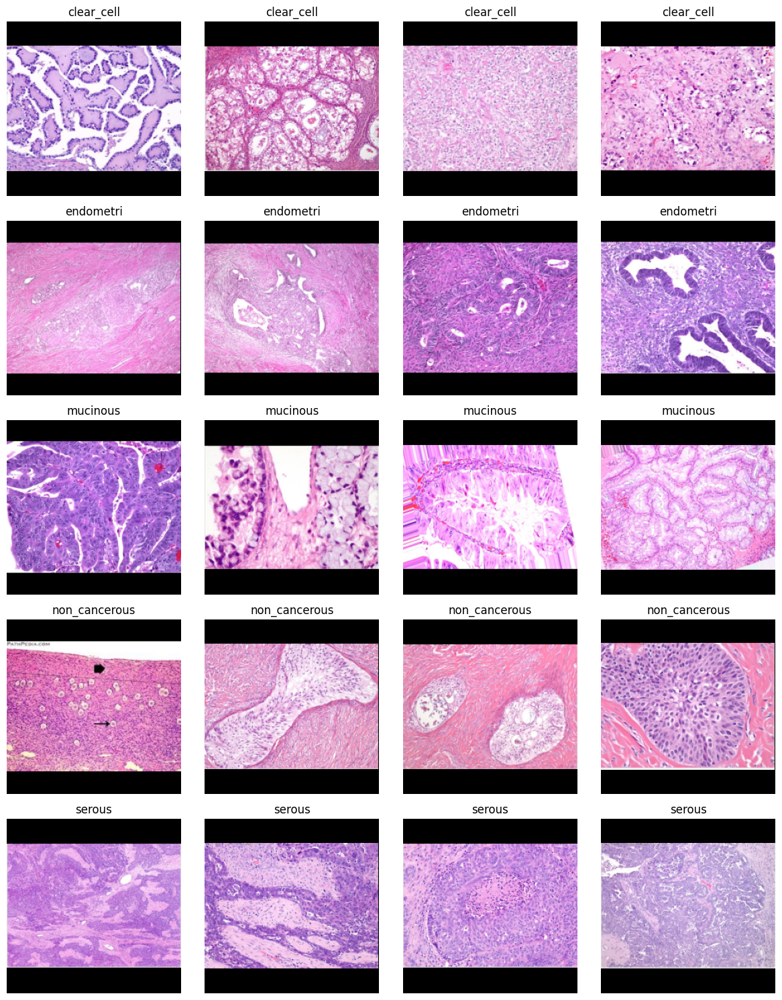

In [3]:
import matplotlib.pyplot as plt
import numpy as np

#funcao para visualizar imagens carregadas
def visualize_images_by_class(images, labels, class_indices, num_images_per_class=4):
    index_to_class = {v: k for k, v in class_indices.items()}
    num_classes = len(class_indices)

    plt.figure(figsize=(12, num_classes * 3))

    for class_idx in range(num_classes):
        class_name = index_to_class[class_idx]
        class_images = [images[i] for i in range(len(images)) if np.argmax(labels[i]) == class_idx]

        for i in range(num_images_per_class):
            if i >= len(class_images):
                break

            plt.subplot(num_classes, num_images_per_class, class_idx * num_images_per_class + i + 1)
            plt.imshow(class_images[i].astype('uint8'))
            plt.title(class_name)
            plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_images_by_class(images, labels, class_indices, num_images_per_class=4)


In [3]:
from sklearn.model_selection import StratifiedKFold

#funcao para dividir de forma igualitaria em 5 folds
def split_dataset_5folds(images, labels, n_splits=5):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    labels_indices = np.argmax(labels, axis=1)

    folds = list(skf.split(images, labels_indices))
    return folds

# VGGNet 16


Treinando no Fold 1...
Epoch 1/20
13/13 [==============================] - 20s 724ms/step - loss: 18.0230 - accuracy: 0.3300 - val_loss: 7.9220 - val_accuracy: 0.4600
Epoch 2/20
13/13 [==============================] - 4s 297ms/step - loss: 12.0906 - accuracy: 0.4207 - val_loss: 4.7094 - val_accuracy: 0.5300
Epoch 3/20
13/13 [==============================] - 4s 299ms/step - loss: 9.5157 - accuracy: 0.4685 - val_loss: 3.4818 - val_accuracy: 0.6400
Epoch 4/20
13/13 [==============================] - 4s 298ms/step - loss: 5.9618 - accuracy: 0.5642 - val_loss: 2.8891 - val_accuracy: 0.6600
Epoch 5/20
13/13 [==============================] - 4s 295ms/step - loss: 4.6023 - accuracy: 0.5718 - val_loss: 2.2178 - val_accuracy: 0.6500
Epoch 6/20
13/13 [==============================] - 4s 303ms/step - loss: 4.3068 - accuracy: 0.5542 - val_loss: 2.2317 - val_accuracy: 0.6500
Epoch 7/20
13/13 [==============================] - 4s 303ms/step - loss: 3.2851 - accuracy: 0.6071 - val_loss: 2.1520 - 

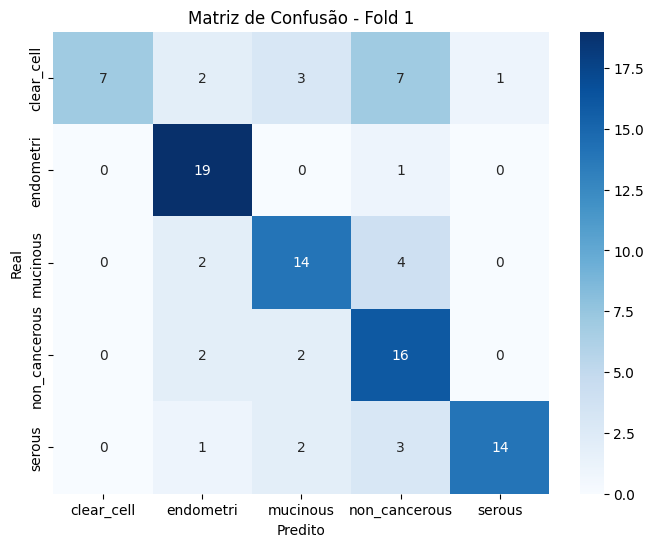

Erros de Classificação no Fold 1:


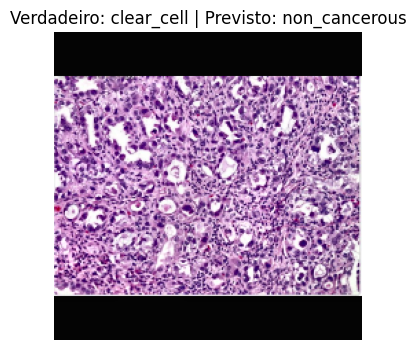

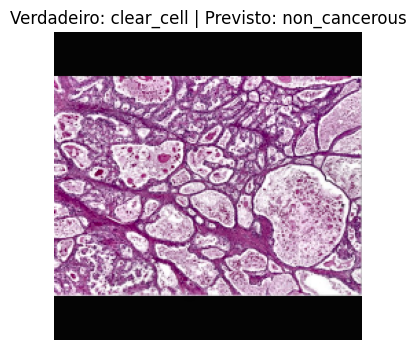

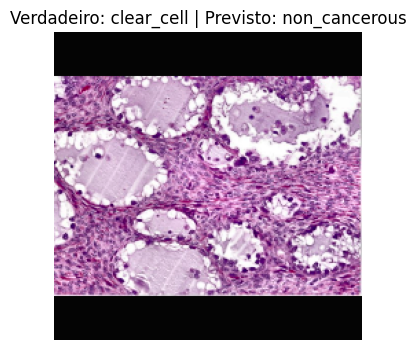

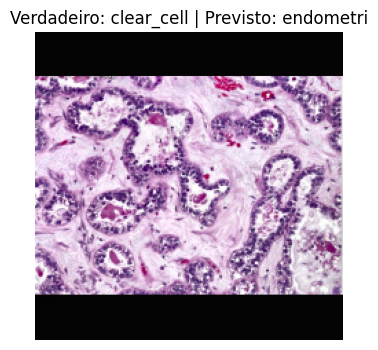

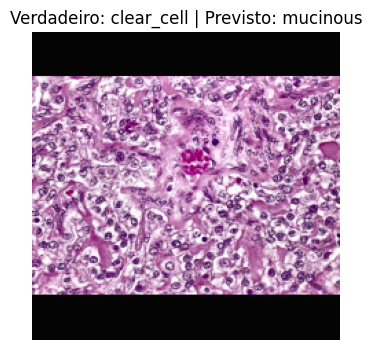


Treinando no Fold 2...
Epoch 1/20
13/13 [==============================] - 10s 715ms/step - loss: 18.1795 - accuracy: 0.2915 - val_loss: 7.1827 - val_accuracy: 0.4747
Epoch 2/20
13/13 [==============================] - 4s 299ms/step - loss: 10.3958 - accuracy: 0.4573 - val_loss: 4.6380 - val_accuracy: 0.6263
Epoch 3/20
13/13 [==============================] - 4s 293ms/step - loss: 8.4400 - accuracy: 0.5126 - val_loss: 4.8627 - val_accuracy: 0.5859
Epoch 4/20
13/13 [==============================] - 4s 300ms/step - loss: 5.6051 - accuracy: 0.5930 - val_loss: 3.3665 - val_accuracy: 0.6364
Epoch 5/20
13/13 [==============================] - 4s 316ms/step - loss: 5.5136 - accuracy: 0.5603 - val_loss: 3.0737 - val_accuracy: 0.6465
Epoch 6/20
13/13 [==============================] - 4s 301ms/step - loss: 5.0195 - accuracy: 0.5854 - val_loss: 2.6636 - val_accuracy: 0.6465
Epoch 7/20
13/13 [==============================] - 4s 298ms/step - loss: 3.8929 - accuracy: 0.6055 - val_loss: 2.1275 - 

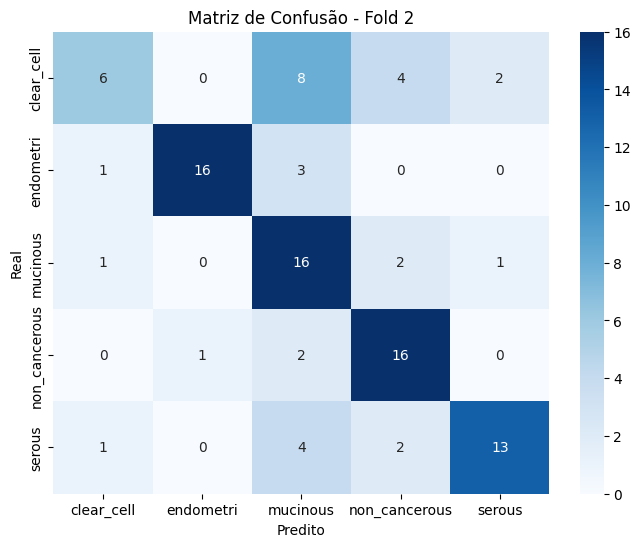

Erros de Classificação no Fold 2:


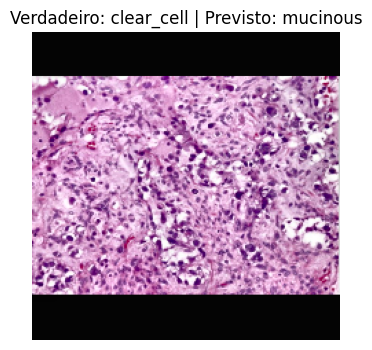

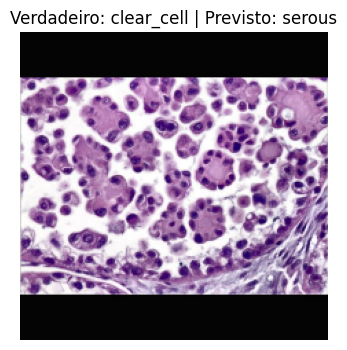

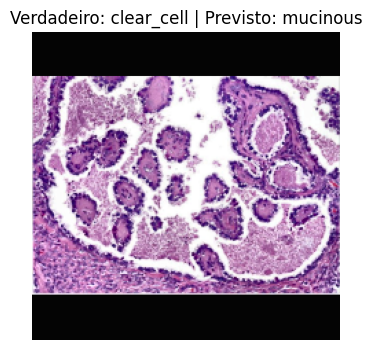

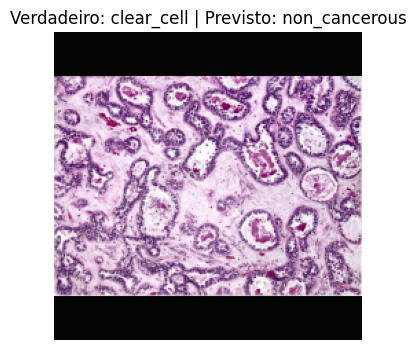

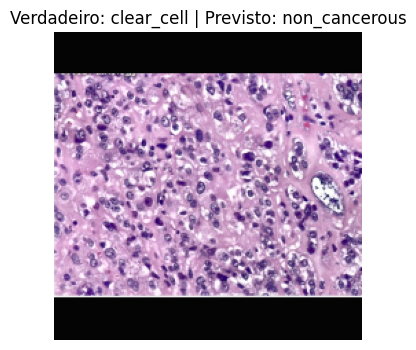


Treinando no Fold 3...
Epoch 1/20
13/13 [==============================] - 5s 310ms/step - loss: 21.0647 - accuracy: 0.2337 - val_loss: 6.1775 - val_accuracy: 0.3838
Epoch 2/20
13/13 [==============================] - 4s 317ms/step - loss: 9.7537 - accuracy: 0.4372 - val_loss: 4.4131 - val_accuracy: 0.5657
Epoch 3/20
13/13 [==============================] - 4s 302ms/step - loss: 7.3735 - accuracy: 0.5075 - val_loss: 3.0425 - val_accuracy: 0.5758
Epoch 4/20
13/13 [==============================] - 4s 304ms/step - loss: 5.8909 - accuracy: 0.5352 - val_loss: 2.6264 - val_accuracy: 0.6162
Epoch 5/20
13/13 [==============================] - 4s 302ms/step - loss: 4.7837 - accuracy: 0.5553 - val_loss: 2.0438 - val_accuracy: 0.6364
Epoch 6/20
13/13 [==============================] - 4s 300ms/step - loss: 4.1785 - accuracy: 0.6030 - val_loss: 2.1715 - val_accuracy: 0.5859
Epoch 7/20
13/13 [==============================] - 4s 304ms/step - loss: 3.2602 - accuracy: 0.5603 - val_loss: 1.7365 - va

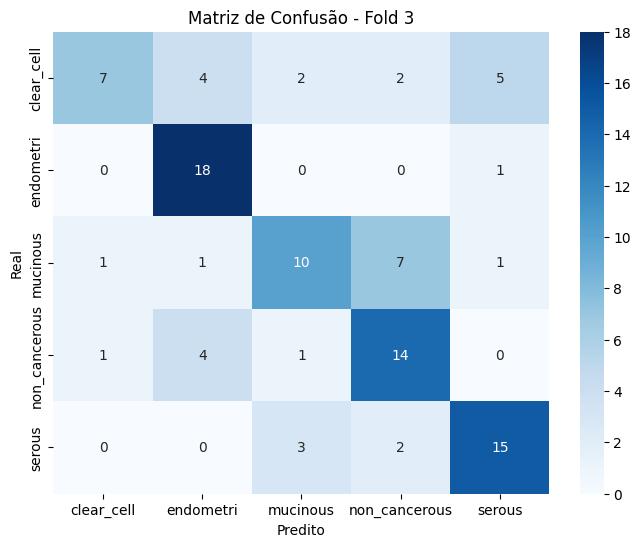

Erros de Classificação no Fold 3:


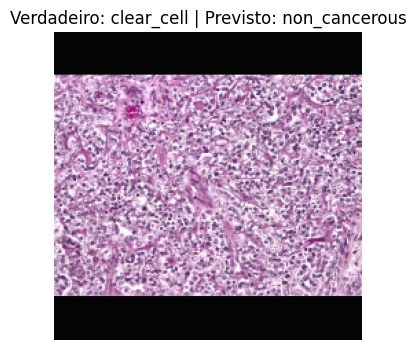

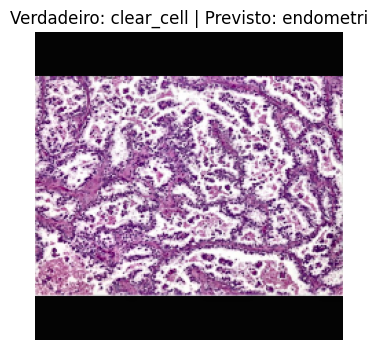

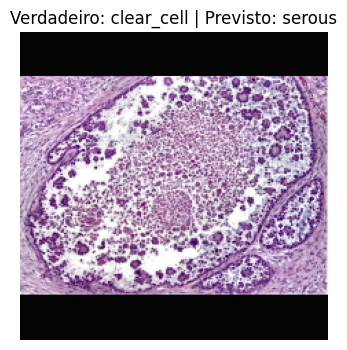

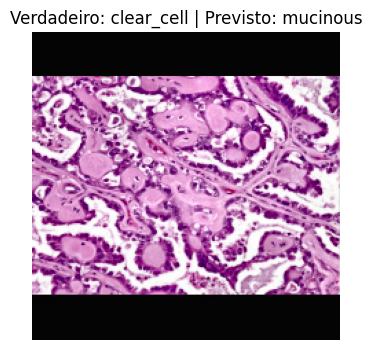

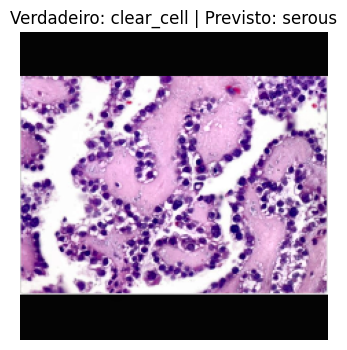


Treinando no Fold 4...
Epoch 1/20
13/13 [==============================] - 5s 304ms/step - loss: 17.6320 - accuracy: 0.3191 - val_loss: 7.8616 - val_accuracy: 0.4141
Epoch 2/20
13/13 [==============================] - 4s 303ms/step - loss: 10.7716 - accuracy: 0.4623 - val_loss: 5.0971 - val_accuracy: 0.6162
Epoch 3/20
13/13 [==============================] - 4s 307ms/step - loss: 8.2194 - accuracy: 0.5050 - val_loss: 3.6470 - val_accuracy: 0.6364
Epoch 4/20
13/13 [==============================] - 4s 303ms/step - loss: 6.4698 - accuracy: 0.5276 - val_loss: 2.2046 - val_accuracy: 0.6869
Epoch 5/20
13/13 [==============================] - 4s 299ms/step - loss: 5.2932 - accuracy: 0.5829 - val_loss: 2.1355 - val_accuracy: 0.6364
Epoch 6/20
13/13 [==============================] - 4s 303ms/step - loss: 4.0423 - accuracy: 0.5603 - val_loss: 2.0588 - val_accuracy: 0.5758
Epoch 7/20
13/13 [==============================] - 4s 338ms/step - loss: 3.7183 - accuracy: 0.5653 - val_loss: 1.9039 - v

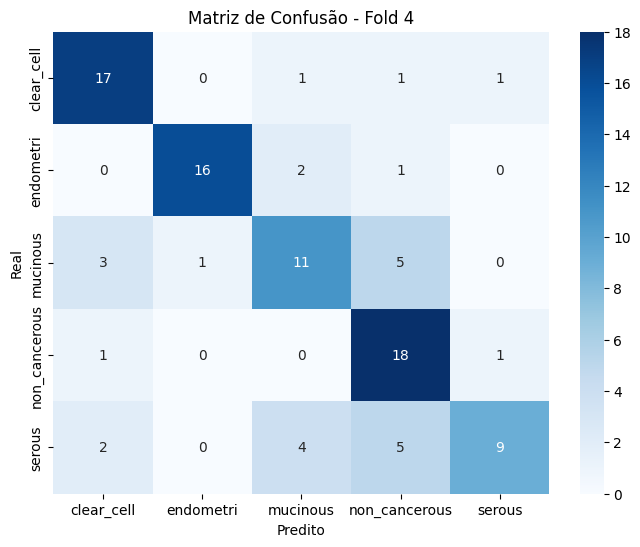

Erros de Classificação no Fold 4:


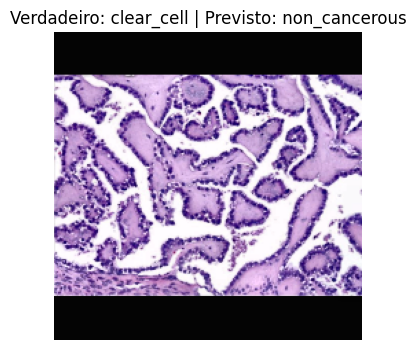

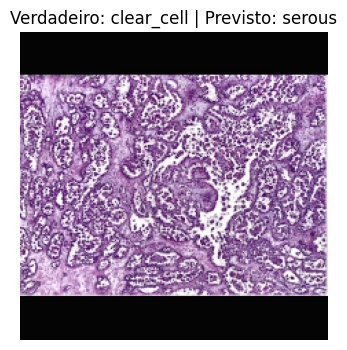

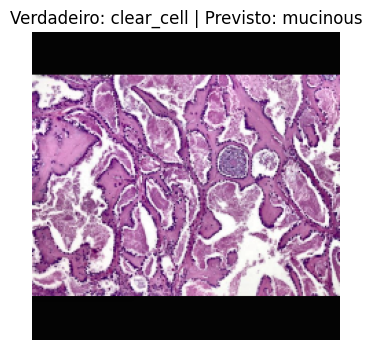

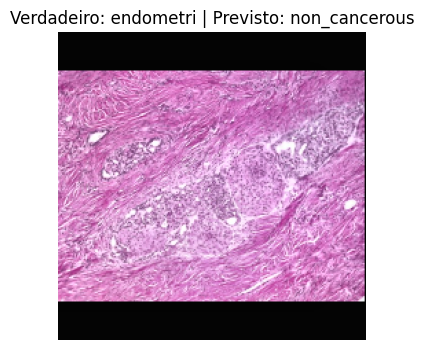

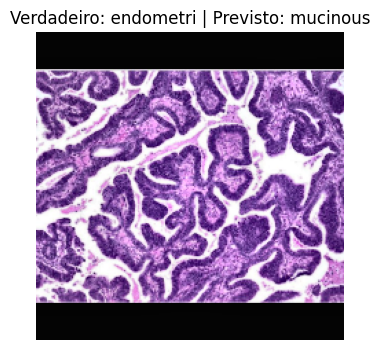


=== Avaliação no Conjunto de Teste Fixo ===
4/4 [==============================] - 0s 147ms/step
Teste - Accuracy: 0.8300, Precision: 0.8462, Recall: 0.8300, F1-score: 0.8275
              precision    recall  f1-score   support

           0       0.69      0.90      0.78        20
           1       0.91      1.00      0.95        20
           2       0.76      0.80      0.78        20
           3       0.94      0.85      0.89        20
           4       0.92      0.60      0.73        20

    accuracy                           0.83       100
   macro avg       0.85      0.83      0.83       100
weighted avg       0.85      0.83      0.83       100



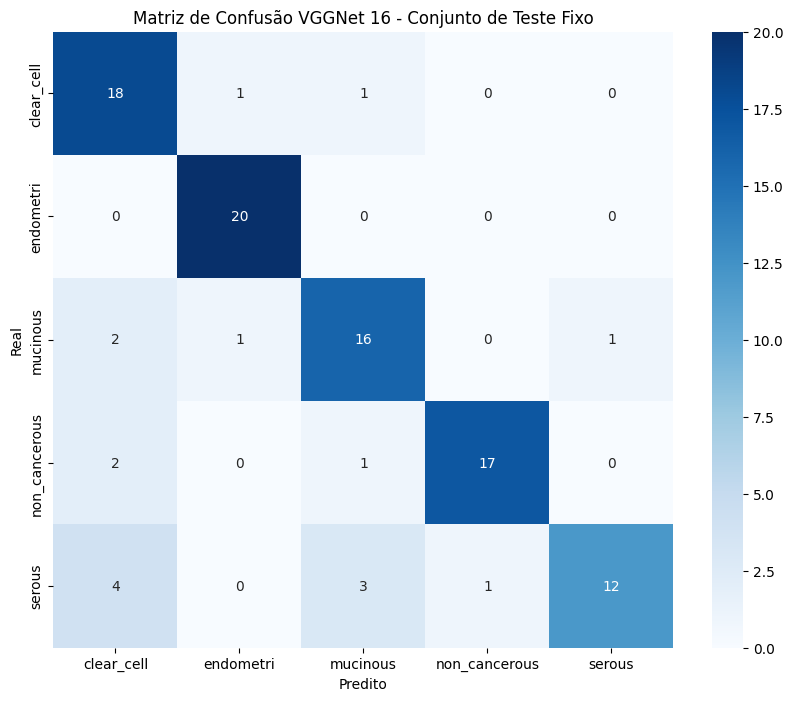

In [5]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#definicoes do modelo
vgg_img_height, vgg_img_width = 224, 224  #tamanho esperado das imagens
vgg_batch_size = 32  #tamanho do batch
vgg_num_classes = labels.shape[1]  #numero de classes no dataset

#funcao para construir o modelo VGG16
def create_vgg_model(input_shape, num_classes):
    vgg_base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    for layer in vgg_base_model.layers:
        layer.trainable = False

    model = models.Sequential([
        vgg_base_model,
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss="categorical_crossentropy",
                  metrics=['accuracy'])
    return model

#data augmentation - treinamento
datagen_train = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_val_test = ImageDataGenerator()

#geracao dos folds
folds = split_dataset_5folds(images, labels)
test_fold = folds[0]  #1 fold fixo para teste
train_val_folds = folds[1:]  #4 folds para treinamento/validação

#separando o conjunto de teste fixo
test_idx = test_fold[1]
X_test, y_test = images[test_idx], labels[test_idx]

#configuracao e treinamento
accuracies = []
precisions = []
recalls = []
f1_scores = []
all_confusion_matrices = []

for i, (train_idx, val_idx) in enumerate(train_val_folds):
    print(f"\nTreinando no Fold {i+1}...")

    X_train, X_val = images[train_idx], images[val_idx]
    y_train, y_val = labels[train_idx], labels[val_idx]

    train_generator = datagen_train.flow(X_train, y_train, batch_size=vgg_batch_size)
    val_generator = datagen_val_test.flow(X_val, y_val, batch_size=vgg_batch_size, shuffle=False)

    vgg_model = create_vgg_model(input_shape=(vgg_img_height, vgg_img_width, 3), num_classes=vgg_num_classes)
    vgg_history = vgg_model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        epochs=20,
        validation_data=val_generator,
        validation_steps=len(val_generator)
    )

    y_val_pred = vgg_model.predict(X_val)
    y_val_pred_classes = np.argmax(y_val_pred, axis=1)  #classes previstas
    y_val_true = np.argmax(y_val, axis=1)  #classes reais

    #calculo metricas
    accuracy = accuracy_score(y_val_true, y_val_pred_classes)
    precision = precision_score(y_val_true, y_val_pred_classes, average='weighted')
    recall = recall_score(y_val_true, y_val_pred_classes, average='weighted')
    f1 = f1_score(y_val_true, y_val_pred_classes, average='weighted')

    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    print(f"Fold {i+1} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")
    print(classification_report(y_val_true, y_val_pred_classes))

    #matriz de confusao
    conf_matrix = confusion_matrix(y_val_true, y_val_pred_classes)
    all_confusion_matrices.append(conf_matrix)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
    plt.title(f'Matriz de Confusão - Fold {i+1}')
    plt.xlabel('Predito')
    plt.ylabel('Real')
    plt.show()

    #erros de classificação
    errors = np.where(y_val_true != y_val_pred_classes)[0]
    if len(errors) > 0:
        print(f"Erros de Classificação no Fold {i+1}:")
        for j, error_idx in enumerate(errors[:5]):  # Mostrar até 5 erros
            plt.figure(figsize=(4, 4))
            plt.imshow(X_val[error_idx].astype("uint8"))
            true_label = list(class_indices.keys())[y_val_true[error_idx]]
            pred_label = list(class_indices.keys())[y_val_pred_classes[error_idx]]
            plt.title(f"Verdadeiro: {true_label} | Previsto: {pred_label}")
            plt.axis("off")
            plt.show()

#avaliação no conjunto de teste fixo
print("\n=== Avaliação no Conjunto de Teste Fixo ===")
test_generator = datagen_val_test.flow(X_test, y_test, batch_size=vgg_batch_size, shuffle=False)
y_test_pred = vgg_model.predict(X_test)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)
y_test_true = np.argmax(y_test, axis=1)

#metricas no conjunto de teste fixo
test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
test_precision = precision_score(y_test_true, y_test_pred_classes, average='weighted')
test_recall = recall_score(y_test_true, y_test_pred_classes, average='weighted')
test_f1 = f1_score(y_test_true, y_test_pred_classes, average='weighted')

print(f"Teste - Accuracy: {test_accuracy:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-score: {test_f1:.4f}")
print(classification_report(y_test_true, y_test_pred_classes))

#matriz de confusão no conjunto de teste fixo
test_conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
plt.title('Matriz de Confusão VGGNet 16 - Conjunto de Teste Fixo')
plt.xlabel('Predito')
plt.ylabel('Real')
plt.show()


# ResNet50


Treinando no Fold 1...
Epoch 1/20
13/13 [==============================] - 9s 446ms/step - loss: 3.9109 - accuracy: 0.2393 - val_loss: 2.0589 - val_accuracy: 0.2500
Epoch 2/20
13/13 [==============================] - 4s 288ms/step - loss: 3.0487 - accuracy: 0.2645 - val_loss: 1.4311 - val_accuracy: 0.3600
Epoch 3/20
13/13 [==============================] - 4s 282ms/step - loss: 2.0759 - accuracy: 0.2897 - val_loss: 1.3555 - val_accuracy: 0.4900
Epoch 4/20
13/13 [==============================] - 4s 289ms/step - loss: 1.7509 - accuracy: 0.3325 - val_loss: 1.3712 - val_accuracy: 0.5100
Epoch 5/20
13/13 [==============================] - 4s 283ms/step - loss: 1.6624 - accuracy: 0.2972 - val_loss: 1.3664 - val_accuracy: 0.4400
Epoch 6/20
13/13 [==============================] - 4s 283ms/step - loss: 1.5163 - accuracy: 0.3300 - val_loss: 1.4055 - val_accuracy: 0.4900
Epoch 7/20
13/13 [==============================] - 4s 288ms/step - loss: 1.4897 - accuracy: 0.3501 - val_loss: 1.3241 - val

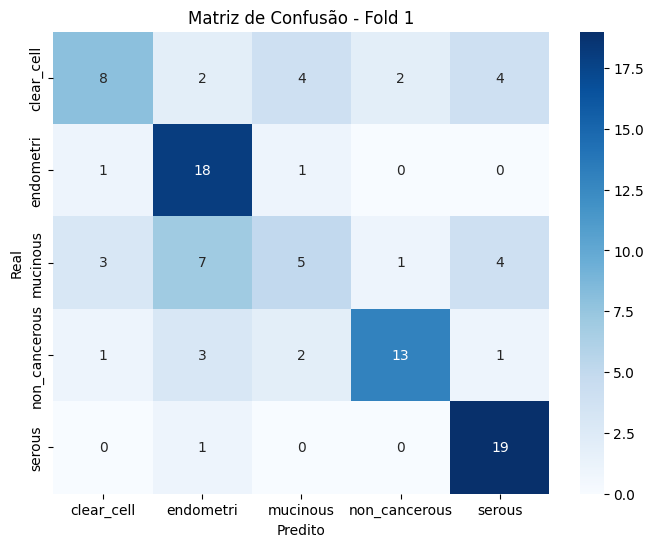

Erros de Classificação no Fold 1:


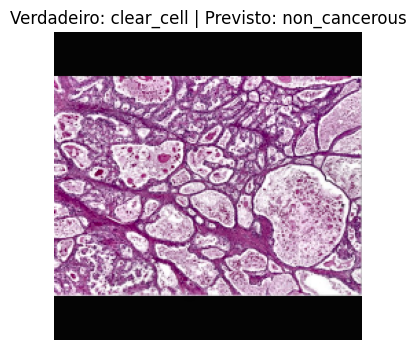

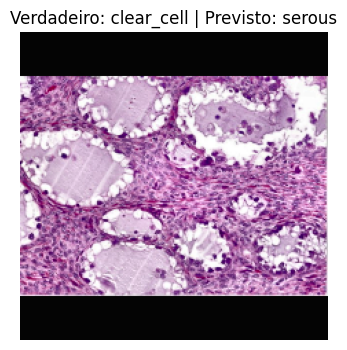

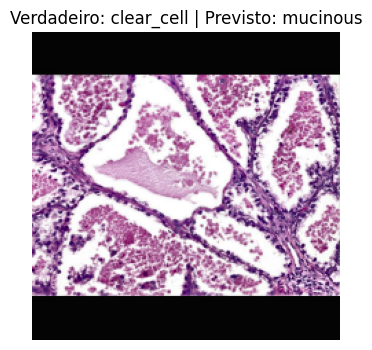

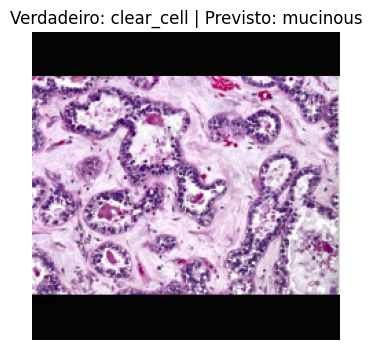

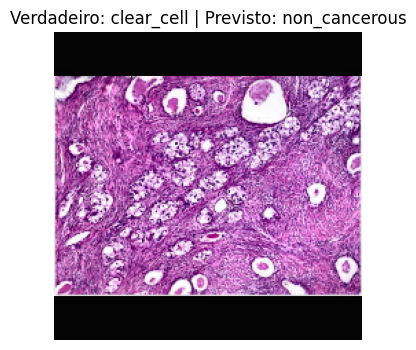


Treinando no Fold 2...
Epoch 1/20
13/13 [==============================] - 8s 422ms/step - loss: 3.5806 - accuracy: 0.2186 - val_loss: 1.6402 - val_accuracy: 0.3333
Epoch 2/20
13/13 [==============================] - 4s 289ms/step - loss: 2.8395 - accuracy: 0.2437 - val_loss: 1.5740 - val_accuracy: 0.3333
Epoch 3/20
13/13 [==============================] - 4s 287ms/step - loss: 2.2099 - accuracy: 0.2663 - val_loss: 1.4860 - val_accuracy: 0.3030
Epoch 4/20
13/13 [==============================] - 4s 282ms/step - loss: 1.8992 - accuracy: 0.2663 - val_loss: 1.4184 - val_accuracy: 0.3636
Epoch 5/20
13/13 [==============================] - 4s 291ms/step - loss: 1.7096 - accuracy: 0.2940 - val_loss: 1.4079 - val_accuracy: 0.4141
Epoch 6/20
13/13 [==============================] - 4s 291ms/step - loss: 1.6473 - accuracy: 0.2839 - val_loss: 1.4358 - val_accuracy: 0.3333
Epoch 7/20
13/13 [==============================] - 4s 287ms/step - loss: 1.6066 - accuracy: 0.3317 - val_loss: 1.3524 - val

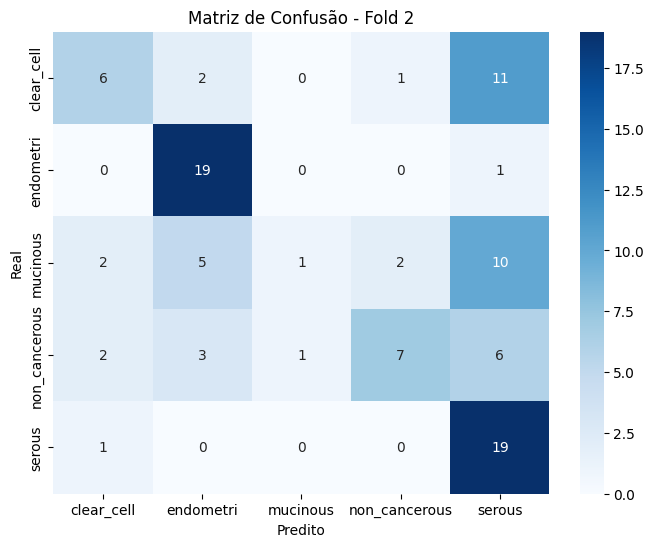

Erros de Classificação no Fold 2:


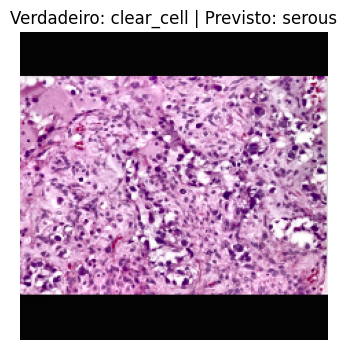

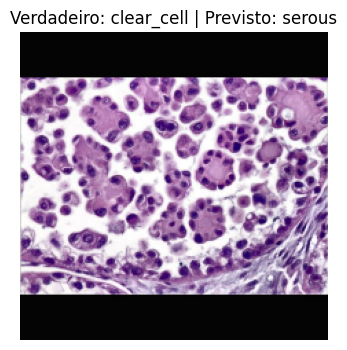

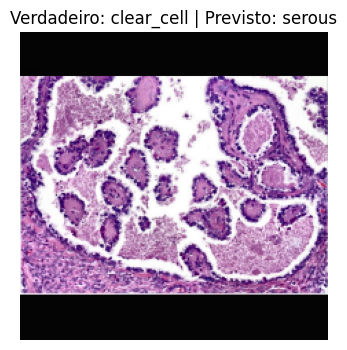

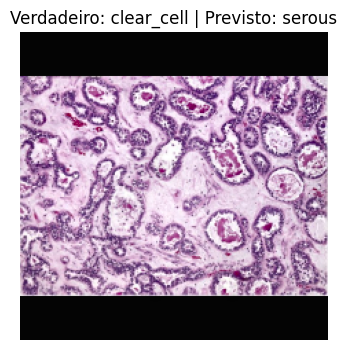

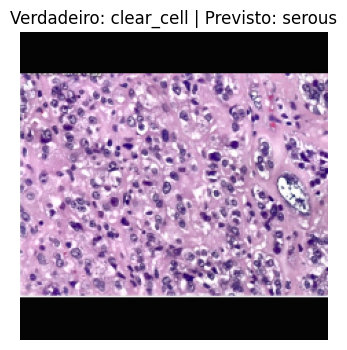


Treinando no Fold 3...
Epoch 1/20
13/13 [==============================] - 7s 338ms/step - loss: 4.5448 - accuracy: 0.2035 - val_loss: 1.5047 - val_accuracy: 0.3131
Epoch 2/20
13/13 [==============================] - 4s 278ms/step - loss: 3.2376 - accuracy: 0.2814 - val_loss: 1.6048 - val_accuracy: 0.3737
Epoch 3/20
13/13 [==============================] - 4s 297ms/step - loss: 2.4315 - accuracy: 0.2412 - val_loss: 1.4255 - val_accuracy: 0.4040
Epoch 4/20
13/13 [==============================] - 4s 297ms/step - loss: 1.7154 - accuracy: 0.2714 - val_loss: 1.4691 - val_accuracy: 0.3333
Epoch 5/20
13/13 [==============================] - 4s 292ms/step - loss: 1.5634 - accuracy: 0.2412 - val_loss: 1.4303 - val_accuracy: 0.2727
Epoch 6/20
13/13 [==============================] - 4s 306ms/step - loss: 1.5546 - accuracy: 0.2814 - val_loss: 1.4548 - val_accuracy: 0.2828
Epoch 7/20
13/13 [==============================] - 4s 313ms/step - loss: 1.5000 - accuracy: 0.3116 - val_loss: 1.4618 - val

c:\Users\Igor Estrela\miniconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Igor Estrela\miniconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Igor Estrela\miniconda3\envs\tf_gpu\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()

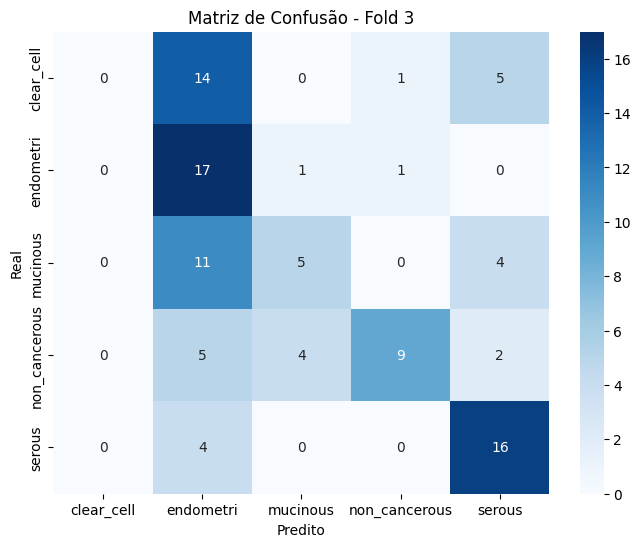

Erros de Classificação no Fold 3:


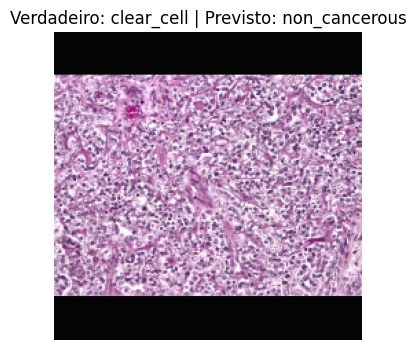

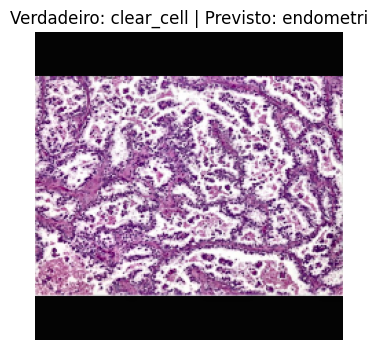

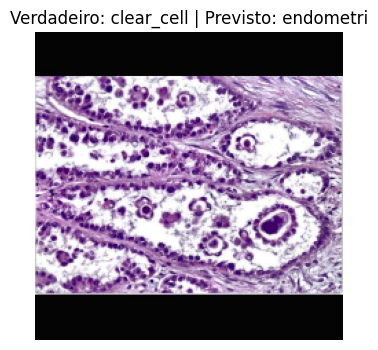

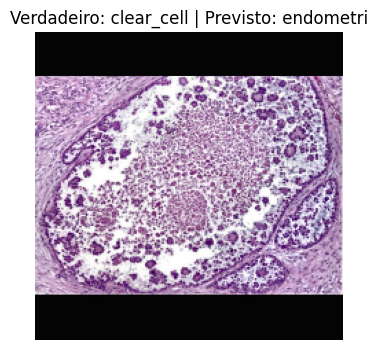

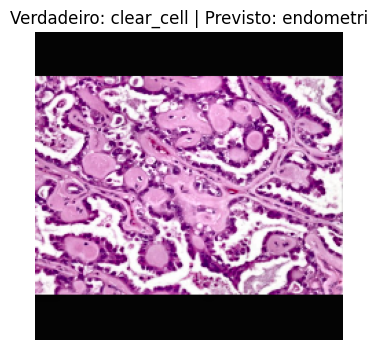


Treinando no Fold 4...
Epoch 1/20
13/13 [==============================] - 7s 354ms/step - loss: 3.9054 - accuracy: 0.1960 - val_loss: 1.5038 - val_accuracy: 0.2828
Epoch 2/20
13/13 [==============================] - 4s 281ms/step - loss: 3.2403 - accuracy: 0.2513 - val_loss: 1.2834 - val_accuracy: 0.4747
Epoch 3/20
13/13 [==============================] - 4s 294ms/step - loss: 2.0956 - accuracy: 0.3216 - val_loss: 1.3300 - val_accuracy: 0.5051
Epoch 4/20
13/13 [==============================] - 4s 282ms/step - loss: 1.7242 - accuracy: 0.3116 - val_loss: 1.3923 - val_accuracy: 0.4141
Epoch 5/20
13/13 [==============================] - 4s 300ms/step - loss: 1.5261 - accuracy: 0.3417 - val_loss: 1.3808 - val_accuracy: 0.3838
Epoch 6/20
13/13 [==============================] - 4s 283ms/step - loss: 1.4742 - accuracy: 0.3719 - val_loss: 1.3173 - val_accuracy: 0.4747
Epoch 7/20
13/13 [==============================] - 4s 286ms/step - loss: 1.4438 - accuracy: 0.3869 - val_loss: 1.2890 - val

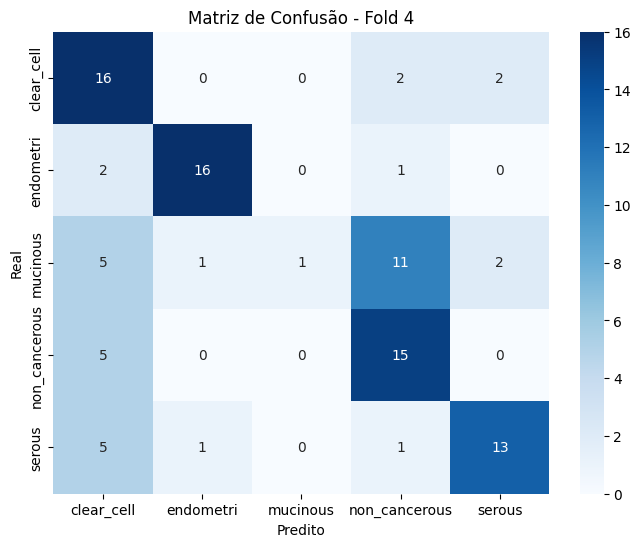

Erros de Classificação no Fold 4:


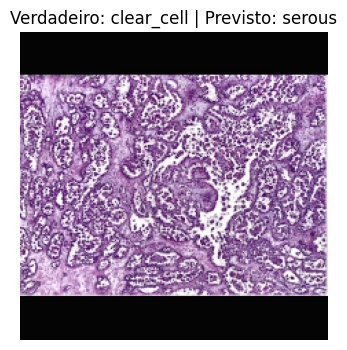

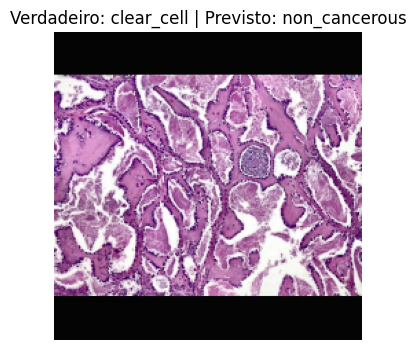

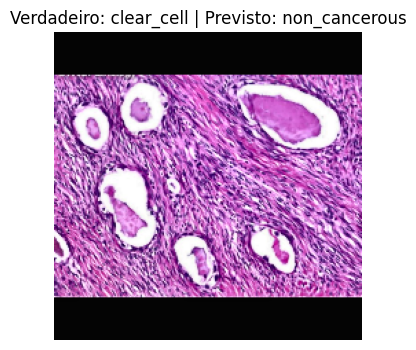

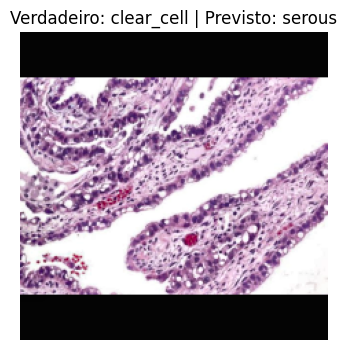

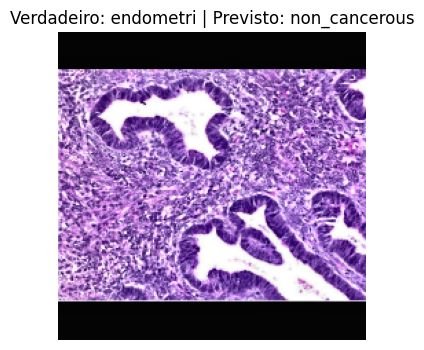


=== Avaliação no Conjunto de Teste Fixo ===
4/4 [==============================] - 0s 99ms/step
Teste - Accuracy: 0.6900, Precision: 0.7141, Recall: 0.6900, F1-score: 0.6474
              precision    recall  f1-score   support

           0       0.54      0.95      0.69        20
           1       0.94      0.85      0.89        20
           2       0.67      0.10      0.17        20
           3       0.67      0.80      0.73        20
           4       0.75      0.75      0.75        20

    accuracy                           0.69       100
   macro avg       0.71      0.69      0.65       100
weighted avg       0.71      0.69      0.65       100



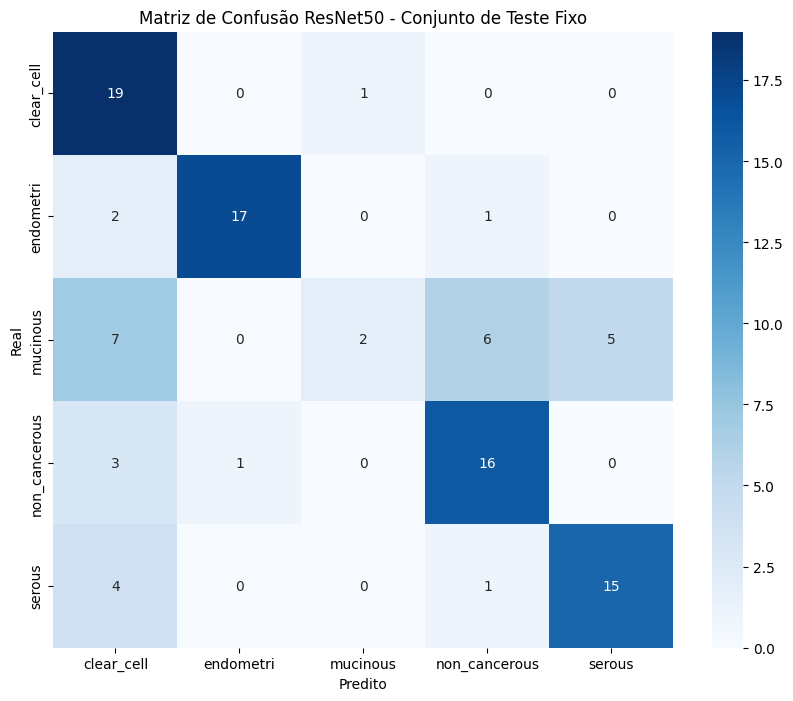

In [6]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import StratifiedKFold

resnet_img_height, resnet_img_width = 224, 224
resnet_batch_size = 32
resnet_num_classes = labels.shape[1]

def create_resnet_model(input_shape, num_classes):
    resnet_base_model = ResNet50(include_top=False, weights='imagenet', input_shape=input_shape)

    for layer in resnet_base_model.layers:
        layer.trainable = False

    model = Sequential([
        resnet_base_model,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss="categorical_crossentropy",
                  metrics=['accuracy'])
    return model

datagen_train = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_val_test = tf.keras.preprocessing.image.ImageDataGenerator()


folds = split_dataset_5folds(images, labels)
test_fold = folds[0] 
train_val_folds = folds[1:]

test_idx = test_fold[1]
X_test, y_test = images[test_idx], labels[test_idx]

accuracies = []
precisions = []
recalls = []
f1_scores = []
all_confusion_matrices = []

for i, (train_idx, val_idx) in enumerate(train_val_folds):
    print(f"\nTreinando no Fold {i+1}...")

    X_train, X_val = images[train_idx], images[val_idx]
    y_train, y_val = labels[train_idx], labels[val_idx]

    train_generator = datagen_train.flow(X_train, y_train, batch_size=resnet_batch_size)
    val_generator = datagen_val_test.flow(X_val, y_val, batch_size=resnet_batch_size, shuffle=False)

    resnet_model = create_resnet_model(input_shape=(resnet_img_height, resnet_img_width, 3), num_classes=resnet_num_classes)
    resnet_history = resnet_model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        epochs=20,
        validation_data=val_generator,
        validation_steps=len(val_generator)
    )

    y_val_pred = resnet_model.predict(X_val)
    y_val_pred_classes = np.argmax(y_val_pred, axis=1)
    y_val_true = np.argmax(y_val, axis=1)

    accuracy = accuracy_score(y_val_true, y_val_pred_classes)
    precision = precision_score(y_val_true, y_val_pred_classes, average='weighted')
    recall = recall_score(y_val_true, y_val_pred_classes, average='weighted')
    f1 = f1_score(y_val_true, y_val_pred_classes, average='weighted')

    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    print(f"Fold {i+1} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")
    print(classification_report(y_val_true, y_val_pred_classes))

    conf_matrix = confusion_matrix(y_val_true, y_val_pred_classes)
    all_confusion_matrices.append(conf_matrix)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
    plt.title(f'Matriz de Confusão - Fold {i+1}')
    plt.xlabel('Predito')
    plt.ylabel('Real')
    plt.show()

    errors = np.where(y_val_true != y_val_pred_classes)[0]
    if len(errors) > 0:
        print(f"Erros de Classificação no Fold {i+1}:")
        for j, error_idx in enumerate(errors[:5]):
            plt.figure(figsize=(4, 4))
            plt.imshow(X_val[error_idx].astype("uint8"))
            true_label = list(class_indices.keys())[y_val_true[error_idx]]
            pred_label = list(class_indices.keys())[y_val_pred_classes[error_idx]]
            plt.title(f"Verdadeiro: {true_label} | Previsto: {pred_label}")
            plt.axis("off")
            plt.show()

print("\n=== Avaliação no Conjunto de Teste Fixo ===")
test_generator = datagen_val_test.flow(X_test, y_test, batch_size=resnet_batch_size, shuffle=False)
y_test_pred = resnet_model.predict(X_test)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)
y_test_true = np.argmax(y_test, axis=1)

test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
test_precision = precision_score(y_test_true, y_test_pred_classes, average='weighted')
test_recall = recall_score(y_test_true, y_test_pred_classes, average='weighted')
test_f1 = f1_score(y_test_true, y_test_pred_classes, average='weighted')

print(f"Teste - Accuracy: {test_accuracy:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-score: {test_f1:.4f}")
print(classification_report(y_test_true, y_test_pred_classes))

test_conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
plt.title('Matriz de Confusão ResNet50 - Conjunto de Teste Fixo')
plt.xlabel('Predito')
plt.ylabel('Real')
plt.show()


# DenseNet 121


Treinando no Fold 1...
Epoch 1/20
13/13 [==============================] - 10s 406ms/step - loss: 16.0810 - accuracy: 0.2897 - val_loss: 5.4426 - val_accuracy: 0.3600
Epoch 2/20
13/13 [==============================] - 4s 283ms/step - loss: 4.6844 - accuracy: 0.4282 - val_loss: 4.5849 - val_accuracy: 0.3400
Epoch 3/20
13/13 [==============================] - 4s 304ms/step - loss: 3.3302 - accuracy: 0.4685 - val_loss: 2.7825 - val_accuracy: 0.4300
Epoch 4/20
13/13 [==============================] - 4s 284ms/step - loss: 1.9194 - accuracy: 0.5340 - val_loss: 2.9561 - val_accuracy: 0.4000
Epoch 5/20
13/13 [==============================] - 4s 282ms/step - loss: 1.6956 - accuracy: 0.5668 - val_loss: 2.2835 - val_accuracy: 0.4900
Epoch 6/20
13/13 [==============================] - 4s 287ms/step - loss: 1.6824 - accuracy: 0.5668 - val_loss: 2.8109 - val_accuracy: 0.4400
Epoch 7/20
13/13 [==============================] - 4s 284ms/step - loss: 1.5045 - accuracy: 0.5919 - val_loss: 1.7168 - v

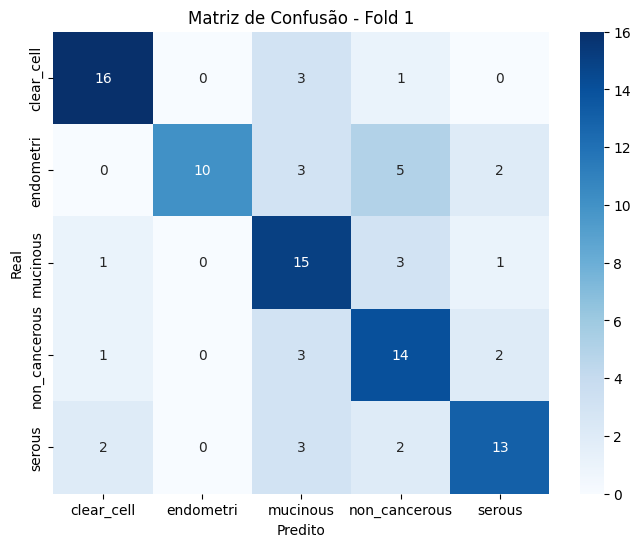

Erros de Classificação no Fold 1:


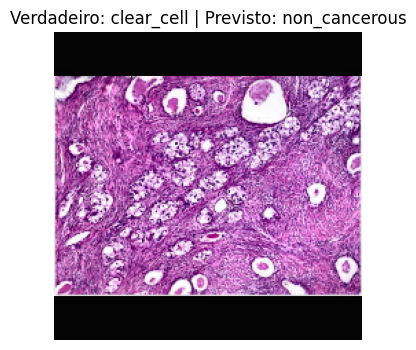

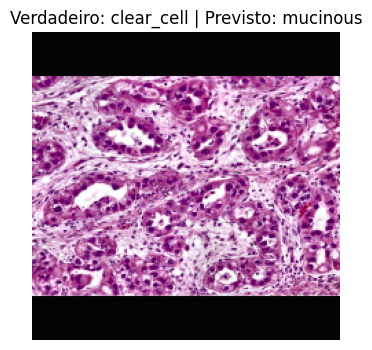

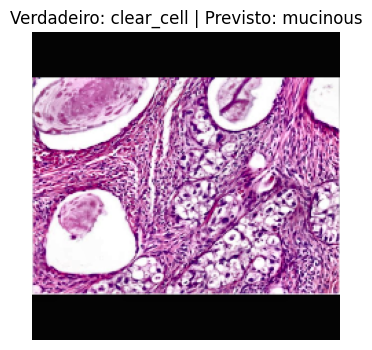

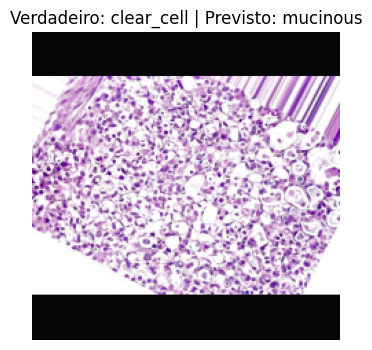

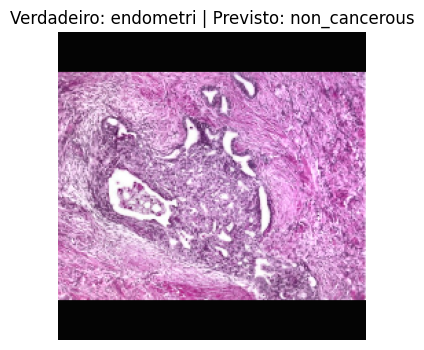


Treinando no Fold 2...
Epoch 1/20
13/13 [==============================] - 11s 427ms/step - loss: 18.5629 - accuracy: 0.2764 - val_loss: 4.9508 - val_accuracy: 0.4848
Epoch 2/20
13/13 [==============================] - 4s 293ms/step - loss: 3.9982 - accuracy: 0.4221 - val_loss: 3.2860 - val_accuracy: 0.3939
Epoch 3/20
13/13 [==============================] - 4s 302ms/step - loss: 2.8985 - accuracy: 0.4121 - val_loss: 2.0789 - val_accuracy: 0.4040
Epoch 4/20
13/13 [==============================] - 4s 290ms/step - loss: 2.0848 - accuracy: 0.4698 - val_loss: 1.5641 - val_accuracy: 0.4747
Epoch 5/20
13/13 [==============================] - 4s 298ms/step - loss: 1.4417 - accuracy: 0.5402 - val_loss: 1.8513 - val_accuracy: 0.4545
Epoch 6/20
13/13 [==============================] - 4s 294ms/step - loss: 1.2529 - accuracy: 0.5729 - val_loss: 1.8579 - val_accuracy: 0.4848
Epoch 7/20
13/13 [==============================] - 4s 288ms/step - loss: 1.3157 - accuracy: 0.5704 - val_loss: 1.7680 - v

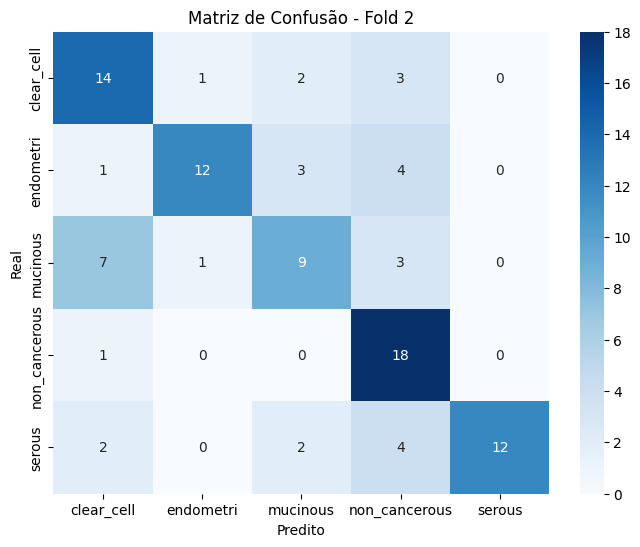

Erros de Classificação no Fold 2:


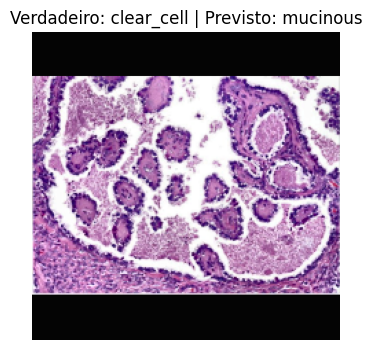

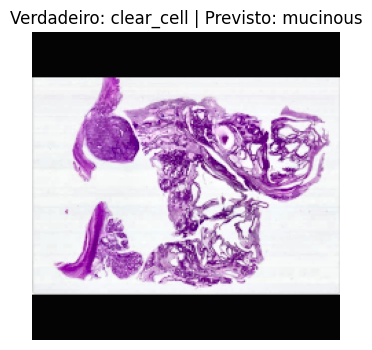

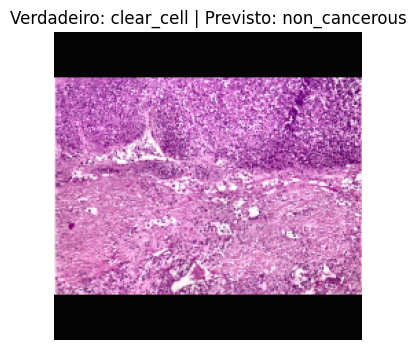

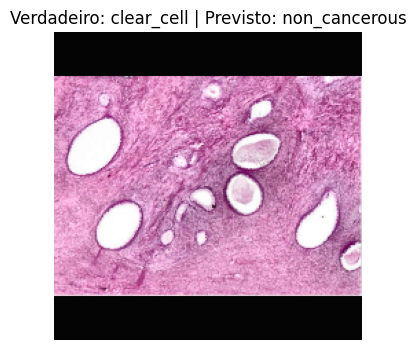

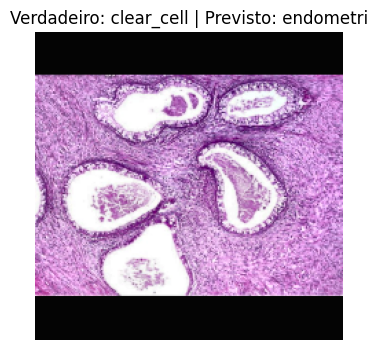


Treinando no Fold 3...
Epoch 1/20
13/13 [==============================] - 11s 427ms/step - loss: 24.6682 - accuracy: 0.3266 - val_loss: 7.3725 - val_accuracy: 0.2525
Epoch 2/20
13/13 [==============================] - 4s 293ms/step - loss: 5.1947 - accuracy: 0.3869 - val_loss: 3.5796 - val_accuracy: 0.3939
Epoch 3/20
13/13 [==============================] - 4s 297ms/step - loss: 3.1686 - accuracy: 0.4121 - val_loss: 3.4173 - val_accuracy: 0.4444
Epoch 4/20
13/13 [==============================] - 4s 305ms/step - loss: 2.1810 - accuracy: 0.4573 - val_loss: 3.5000 - val_accuracy: 0.4343
Epoch 5/20
13/13 [==============================] - 4s 292ms/step - loss: 1.9358 - accuracy: 0.5050 - val_loss: 2.6403 - val_accuracy: 0.4141
Epoch 6/20
13/13 [==============================] - 4s 294ms/step - loss: 1.5462 - accuracy: 0.5427 - val_loss: 1.7500 - val_accuracy: 0.5051
Epoch 7/20
13/13 [==============================] - 4s 312ms/step - loss: 1.3456 - accuracy: 0.5477 - val_loss: 1.4347 - v

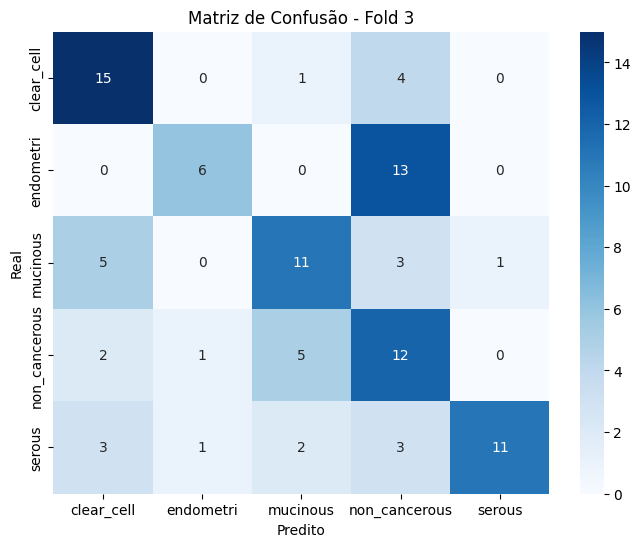

Erros de Classificação no Fold 3:


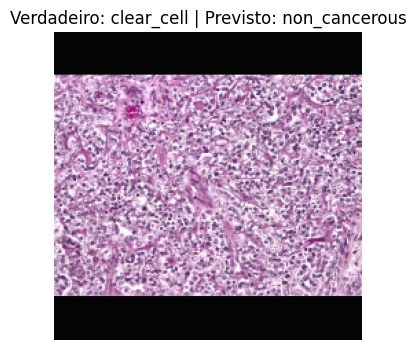

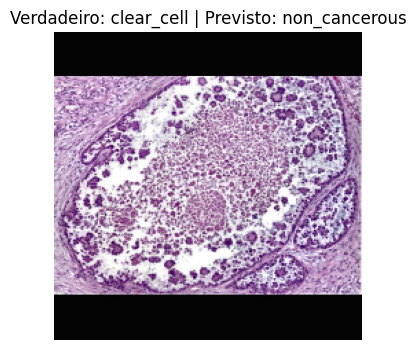

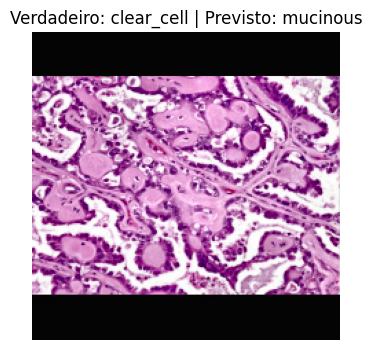

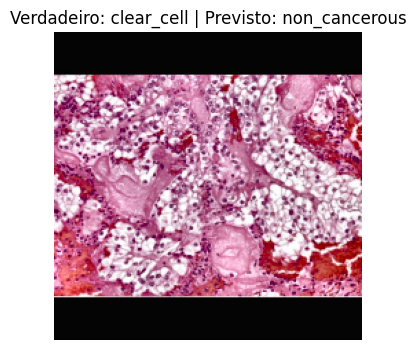

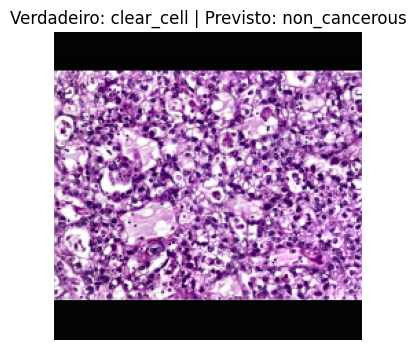


Treinando no Fold 4...
Epoch 1/20
13/13 [==============================] - 11s 428ms/step - loss: 29.7947 - accuracy: 0.2337 - val_loss: 11.9550 - val_accuracy: 0.3232
Epoch 2/20
13/13 [==============================] - 4s 291ms/step - loss: 8.9526 - accuracy: 0.3442 - val_loss: 9.0152 - val_accuracy: 0.3737
Epoch 3/20
13/13 [==============================] - 4s 302ms/step - loss: 4.5128 - accuracy: 0.4523 - val_loss: 3.3968 - val_accuracy: 0.3838
Epoch 4/20
13/13 [==============================] - 4s 304ms/step - loss: 2.0914 - accuracy: 0.5251 - val_loss: 2.4073 - val_accuracy: 0.4343
Epoch 5/20
13/13 [==============================] - 4s 293ms/step - loss: 1.6450 - accuracy: 0.5653 - val_loss: 1.8417 - val_accuracy: 0.4545
Epoch 6/20
13/13 [==============================] - 4s 319ms/step - loss: 1.7544 - accuracy: 0.5151 - val_loss: 1.7812 - val_accuracy: 0.4747
Epoch 7/20
13/13 [==============================] - 4s 298ms/step - loss: 1.4635 - accuracy: 0.5653 - val_loss: 2.0175 - 

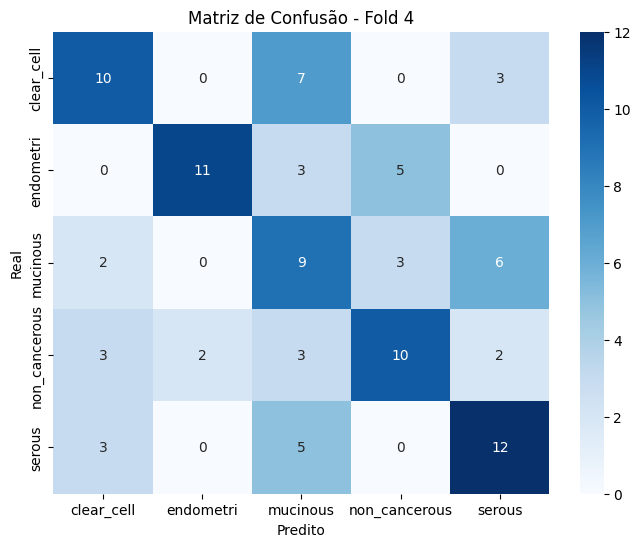

Erros de Classificação no Fold 4:


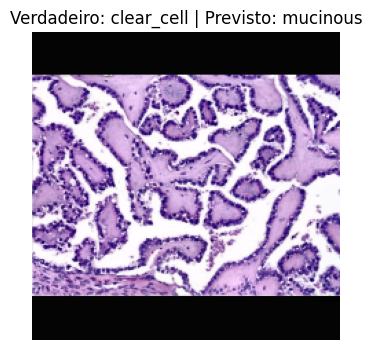

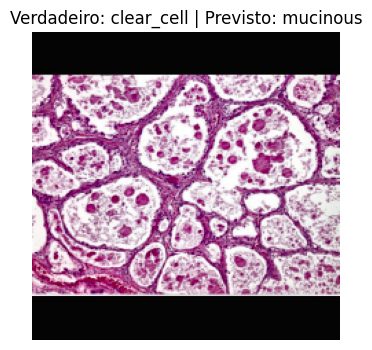

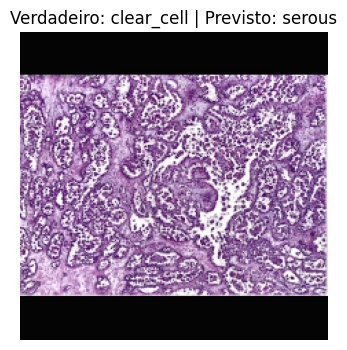

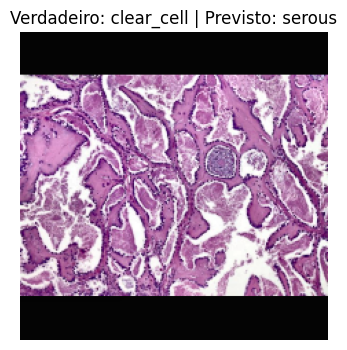

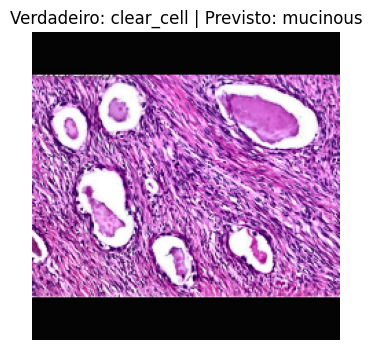


=== Avaliação no Conjunto de Teste Fixo ===
4/4 [==============================] - 0s 93ms/step
Teste - Accuracy: 0.7100, Precision: 0.7641, Recall: 0.7100, F1-score: 0.7156
              precision    recall  f1-score   support

           0       0.76      0.65      0.70        20
           1       1.00      0.75      0.86        20
           2       0.52      0.70      0.60        20
           3       0.92      0.55      0.69        20
           4       0.62      0.90      0.73        20

    accuracy                           0.71       100
   macro avg       0.76      0.71      0.72       100
weighted avg       0.76      0.71      0.72       100



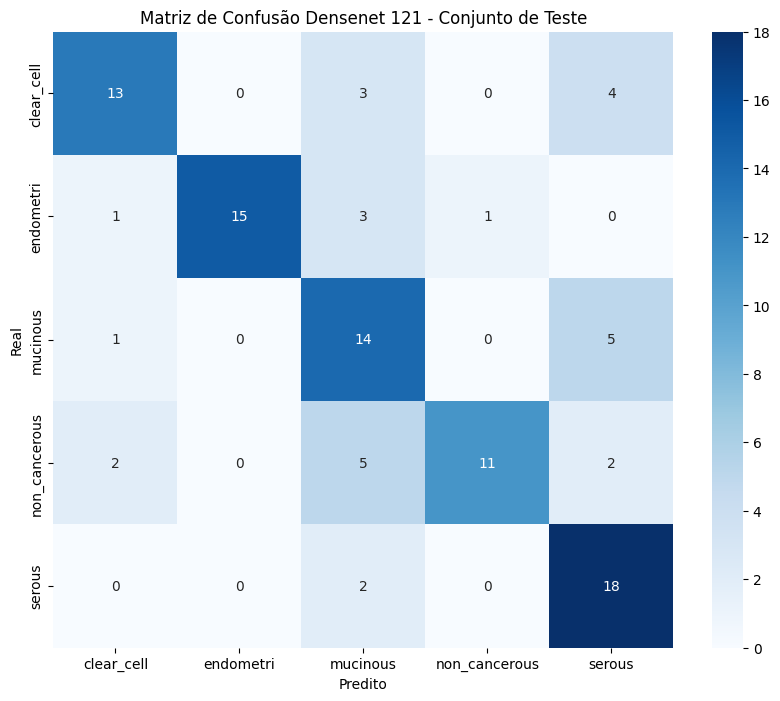

In [63]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold

densenet_img_height, densenet_img_width = 224, 224
densenet_batch_size = 32
densenet_num_classes = labels.shape[1]

def create_densenet_model(input_shape, num_classes):
    densenet_base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=input_shape)

    for layer in densenet_base_model.layers:
        layer.trainable = False

    model = Sequential([
        densenet_base_model,
        Flatten(),
        Dense(256, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss="categorical_crossentropy",
                  metrics=['accuracy'])
    return model

datagen_train = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_val_test = tf.keras.preprocessing.image.ImageDataGenerator()

def split_dataset_5folds(images, labels, n_splits=5):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    labels_indices = np.argmax(labels, axis=1)
    folds = list(skf.split(images, labels_indices))
    return folds

n_splits = 5
folds = split_dataset_5folds(images, labels, n_splits=n_splits)
test_fold = folds[0]
train_val_folds = folds[1:]

test_idx = test_fold[1]
X_test, y_test = images[test_idx], labels[test_idx]

accuracies = []
precisions = []
recalls = []
f1_scores = []
all_confusion_matrices = []

for i, (train_idx, val_idx) in enumerate(train_val_folds):
    print(f"\nTreinando no Fold {i+1}...")

    X_train, X_val = images[train_idx], images[val_idx]
    y_train, y_val = labels[train_idx], labels[val_idx]

    train_generator = datagen_train.flow(X_train, y_train, batch_size=densenet_batch_size)
    val_generator = datagen_val_test.flow(X_val, y_val, batch_size=densenet_batch_size, shuffle=False)

    densenet_model = create_densenet_model(input_shape=(densenet_img_height, densenet_img_width, 3), num_classes=densenet_num_classes)
    densenet_history = densenet_model.fit(
        train_generator,
        steps_per_epoch=len(train_generator),
        epochs=20,
        validation_data=val_generator,
        validation_steps=len(val_generator)
    )

    y_val_pred = densenet_model.predict(X_val)
    y_val_pred_classes = np.argmax(y_val_pred, axis=1)
    y_val_true = np.argmax(y_val, axis=1)

    accuracy = accuracy_score(y_val_true, y_val_pred_classes)
    precision = precision_score(y_val_true, y_val_pred_classes, average='weighted')
    recall = recall_score(y_val_true, y_val_pred_classes, average='weighted')
    f1 = f1_score(y_val_true, y_val_pred_classes, average='weighted')

    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    print(f"Fold {i+1} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")
    print(classification_report(y_val_true, y_val_pred_classes))

    conf_matrix = confusion_matrix(y_val_true, y_val_pred_classes)
    all_confusion_matrices.append(conf_matrix)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
    plt.title(f'Matriz de Confusão - Fold {i+1}')
    plt.xlabel('Predito')
    plt.ylabel('Real')
    plt.show()

    densenet_model.save(f'densenet_model_fold_clahe_{i+1}.h5')

    errors = np.where(y_val_true != y_val_pred_classes)[0]
    if len(errors) > 0:
        print(f"Erros de Classificação no Fold {i+1}:")
        for j, error_idx in enumerate(errors[:5]):
            plt.figure(figsize=(4, 4))
            plt.imshow(X_val[error_idx].astype("uint8"))
            true_label = list(class_indices.keys())[y_val_true[error_idx]]
            pred_label = list(class_indices.keys())[y_val_pred_classes[error_idx]]
            plt.title(f"Verdadeiro: {true_label} | Previsto: {pred_label}")
            plt.axis("off")
            plt.show()

print("\n=== Avaliação no Conjunto de Teste Fixo ===")
test_generator = datagen_val_test.flow(X_test, y_test, batch_size=densenet_batch_size, shuffle=False)
y_test_pred = densenet_model.predict(X_test)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)
y_test_true = np.argmax(y_test, axis=1)

test_accuracy = accuracy_score(y_test_true, y_test_pred_classes)
test_precision = precision_score(y_test_true, y_test_pred_classes, average='weighted')
test_recall = recall_score(y_test_true, y_test_pred_classes, average='weighted')
test_f1 = f1_score(y_test_true, y_test_pred_classes, average='weighted')

print(f"Teste - Accuracy: {test_accuracy:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-score: {test_f1:.4f}")
print(classification_report(y_test_true, y_test_pred_classes))

test_conf_matrix = confusion_matrix(y_test_true, y_test_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_indices.keys(), yticklabels=class_indices.keys())
plt.title('Matriz de Confusão Densenet 121 - Conjunto de Teste')
plt.xlabel('Predito')
plt.ylabel('Real')
plt.show()


# SwinTransformer

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import timm
from sklearn.metrics import precision_score, f1_score,recall_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def to_torch_tensor(tf_tensor):
    return torch.tensor(tf_tensor, dtype=torch.float32).permute(0, 3, 1, 2)

def train_model(model, train_generator, val_generator, criterion, optimizer, device, epochs=10):
    model.train()
    epoch_loss_history = []
    epoch_accuracy_history = []

    for epoch in range(epochs):
        running_loss = 0.0
        correct = 0
        total = 0
        all_labels = []
        all_predictions = []

        print(f"\nEpoch {epoch+1}/{epochs}")
        for i in range(len(train_generator)):
            images, labels = next(train_generator)
            images = to_torch_tensor(images).to(device)
            labels = torch.tensor(np.argmax(labels, axis=1)).to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

            if (i + 1) % 10 == 0:  # A cada 10 batches
                print(f"Batch {i+1}/{len(train_generator)} - Loss: {loss.item():.4f} - Acurácia: {100 * correct / total:.2f}%")

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        precision = precision_score(all_labels, all_predictions, average='weighted')
        f1 = f1_score(all_labels, all_predictions, average='weighted')

        epoch_loss = running_loss / len(train_generator)
        epoch_acc = 100 * correct / total

        epoch_loss_history.append(epoch_loss)
        epoch_accuracy_history.append(epoch_acc)

        print(f"Epoch {epoch+1}/{epochs} - Loss: {epoch_loss:.4f} - Acurácia: {epoch_acc:.2f}% - Precisão: {precision:.4f} - F1-score: {f1:.4f}")

    return epoch_loss_history, epoch_accuracy_history

def evaluate_model(model, test_generator, device, class_names, 
                   accuracies, precisions, recalls, f1_scores, all_confusion_matrices):

    model.eval()
    correct = 0
    total = 0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for i in range(len(test_generator)):
            images, labels = next(test_generator)
            images = to_torch_tensor(images).to(device)
            labels = torch.tensor(np.argmax(labels, axis=1)).to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

            if (i + 1) % 10 == 0:
                print(f"Batch {i+1}/{len(test_generator)} - Avaliação em progresso")

            if torch.cuda.is_available():
                torch.cuda.empty_cache()

    acc = 100 * correct / total
    precision = precision_score(all_labels, all_predictions, average='weighted')
    recall = recall_score(all_labels, all_predictions, average='weighted')
    f1 = f1_score(all_labels, all_predictions, average='weighted')

    print(f'Acurácia no conjunto de teste: {acc:.2f}% - Precisão: {precision:.4f} - Recall: {recall:.4f} - F1-score: {f1:.4f}')

    accuracies.append(acc)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)

    print("\nGerando matriz de confusão...")
    conf_matrix = confusion_matrix(all_labels, all_predictions)
    all_confusion_matrices.append(conf_matrix)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Matriz de Confusão Swin Transformer- Fold de Teste')
    plt.xlabel('Predito')
    plt.ylabel('Real')
    plt.show()

# Definir o dispositivo para GPU se disponível
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('swin_base_patch4_window7_224', pretrained=True, num_classes=5)
model = model.to(device)  # Enviar o modelo para GPU, se disponível

optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

batch_size = 16




Treinando no Fold 1...

Epoch 1/1
Batch 10/25 - Loss: 1.1693 - Acurácia: 48.75%
Batch 20/25 - Loss: 1.2399 - Acurácia: 51.88%
Epoch 1/1 - Loss: 1.1444 - Acurácia: 51.39% - Precisão: 0.5117 - F1-score: 0.5030

Treinando no Fold 2...

Epoch 1/1
Batch 10/25 - Loss: 1.1422 - Acurácia: 51.88%
Batch 20/25 - Loss: 0.9117 - Acurácia: 57.19%
Epoch 1/1 - Loss: 1.1030 - Acurácia: 59.30% - Precisão: 0.6167 - F1-score: 0.5882

Treinando no Fold 3...

Epoch 1/1
Batch 10/25 - Loss: 1.2061 - Acurácia: 59.38%
Batch 20/25 - Loss: 1.1461 - Acurácia: 54.06%
Epoch 1/1 - Loss: 1.1400 - Acurácia: 52.26% - Precisão: 0.5486 - F1-score: 0.5221

Treinando no Fold 4...

Epoch 1/1
Batch 10/25 - Loss: 1.2647 - Acurácia: 53.12%
Batch 20/25 - Loss: 0.6276 - Acurácia: 60.62%
Epoch 1/1 - Loss: 0.9316 - Acurácia: 62.81% - Precisão: 0.6654 - F1-score: 0.6242

Avaliando o modelo no conjunto de teste...
Acurácia no conjunto de teste: 75.00% - Precisão: 0.7973 - Recall: 0.7500 - F1-score: 0.7498

Gerando matriz de confusão

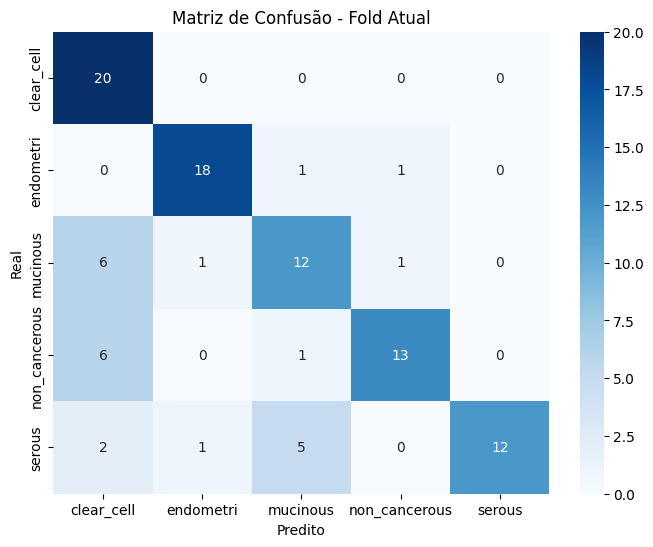


MÉTRICAS FINAIS (Conjunto de Teste):


TypeError: unsupported format string passed to list.__format__

In [ ]:
import tensorflow as tf

datagen_train = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_test_val = tf.keras.preprocessing.image.ImageDataGenerator()


folds = split_dataset_5folds(images, labels)
train_val_folds = folds[1:]
test_fold = folds[0]

test_idx = test_fold[1]
X_test, y_test = images[test_idx], labels[test_idx]
test_generator = datagen_test_val.flow(X_test, y_test, batch_size=16, shuffle=False)

accuracies = []
precisions = []
recalls = []
f1_scores = []
loss_history = []
accuracy_history = []
all_confusion_matrices = []

for i, (train_idx, val_idx) in enumerate(train_val_folds):
    print(f"\nTreinando no Fold {i+1}...")

    X_train, X_val = images[train_idx], images[val_idx]
    y_train, y_val = labels[train_idx], labels[val_idx]

    train_generator = datagen_train.flow(X_train, y_train, batch_size=16)
    val_generator = datagen_test_val.flow(X_val, y_val, batch_size=16, shuffle=False)

    epoch_loss, epoch_accuracy = train_model(model, train_generator, val_generator, criterion, optimizer, device, epochs=1)
    loss_history.append(epoch_loss)
    accuracy_history.append(epoch_accuracy)

print("\nAvaliando o modelo no conjunto de teste...")
accuracies_test = []
precisions_test = []
recalls_test = []
f1_scores_test = []
all_confusion_matrices_test = []

all_labels = []
all_predictions = []
evaluate_model(
    model, 
    test_generator, 
    device, 
    class_indices.keys(), 
    accuracies_test, 
    precisions_test, 
    recalls_test, 
    f1_scores_test, 
    all_confusion_matrices_test
)